In [1]:
from glob import glob

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import anndata
mpl.style.use("default")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "Helvetica"
from ALLCools.plot import *
from ALLCools.mcds import RegionDS, MCDS
from wmb import mm10, cemba


In [2]:
rs1_subregion_dict = {
    "MOp": ["MOp-2", "MOp-3"],
    "SSp": ["SSp-3", "SSp-4"],
    "ACA": ["PFC-2", "ACA-1", "ACA-2"],
    "AI": ["AI"],
    "RSP": ["RSP-3", "RSP-4"],
    "AUD": ["AUD-1", "AUD-2"],
    "PTLp": ["PTLp"],
    "VIS": ["VIS-2", "VIS-3"],
    "ENT": ["RHP-1", "RHP-2", "RHP-3", "RHP-5"],
    "CAa": ["CA-i", "CA-ii"],
    "CAp": ["CA-iii", "CA-iv"],
    "DGa": ["DG-1", "DG-2"],
    "DGp": ["DG-3", "DG-4"],
    "PIRa": ["PIR-1", "PIR-2", "PIR-3", "PIR-4"],
    "PIRp": ["PIR-5", "PIR-6", "PIR-7", "PIR-8"],
    "MOB": ["MOB"],
    "AON": ["AON"],
    "PAL": ["PAL-1", "PAL-2", "PAL-3", "GP"],
    "STR": ["CP-1", "CP-2", "CP-3"],
    "AMY": ["AMY-1", "AMY-2", "AMY-3"],
    "THl": ["TH-1", "TH-3"],
    "THm": ["TH-2", "TH-4"],
    "THp": ["TH-5", "TH-6", "TH-7"],
    "HY": ["HY-1", "HY-2", "HY-3", "HY-4"],
    "SC": ["SC-1", "SC-2", "SC-3"],
    "MRN": ["PAG-3", "PAG-4", "MRN"],
    "VTA": ["VTA-1", "VTA-2"],
    "PAG": ["PAG-1", "PAG-2"],
    "IC": ["IC-1"],
    "P": ["PRN-1", "PRN-2", "PRN-3", "PRN-4", "PCG"],
    "MY": ["MY-1", "MY-2", "MY-3", "MY-4"],
}

rs2_subregion_dict = {
    "MOp": ["3C", "4B"],
    "SSp": ["6B", "7B"],
    "ACA": ["3A", "4A", "5A"],
    "AI": ["3D"],
    "RSP": ["9A", "10A"],
    "AUD": ["9D", "10C"],
    "PTLp": ["9B"],
    "VIS": ["11B", "12B"],
    "ENT": ["10D11D12D13B"],
    "CAa": ["8E9H"],
    "CAp": ["10E11E"],
    "DGa": ["8J9J"],
    "DGp": ["10F11F"],
    "PIRa": ["2D3E4F5G"],
    "PIRp": ["6D7D8D9E"],
    "MOB": ["1C"],
    "AON": ["2E"],
    "PAL": ["4H5H6F7F", "6F7F"],
    "STR": ["4D5E6E"],
    "AMY": ["7H8H9G"],
    "THl": ["7E8F"],
    "THm": ["7G8G"],
    "THp": ["9K10G"],
    "HY": ["6H7J8K9L"],
    "SC": ["11G12F13C"],
    "MRN": ["10H11H12H"],
    "VTA": ["10J11J"],
    "PAG": ["12G13D"],
    "IC": ["14A"],
    "P": ["12J13E13F14C14D"],
    "MY": ["15C16C17B18B"],
}

In [3]:
meta_rs2 = pd.read_csv("/cemba/CEMBA_RS2/cell_48032_RS2_meta_nooutlier.csv.gz", index_col=0, header=0)
meta_rs2 = meta_rs2[meta_rs2["PassTargetFilter"]]
meta_rs2 = meta_rs2.rename(
    {
        "PlateNormReads": "PlateNormCov",
        "Exp": "Sample",
        "Source": "SubRegion",
        "Slice": "DissectionRegion",
    },
    axis=1,
)
meta_rs2

,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,Plate,PlateNormCov,Sample,SubRegion,DissectionRegion,Target,Sex,L1,L2,L3,L4,L1_annot,PassTargetFilter
cell,,,,,,,,,,,,,,,,,
180118_CEMBA_mm_P56_P63_RS2_180117_P1_180117_P2_A10_AD001,0.006500,0.775850,0.032027,1090870.0,180117_P1,-0.555116,Tm3C,MOp,3C,SC,male,c14,c14_c6,c14_c6_c0,c14_c6_c0_c0,ET,True
180118_CEMBA_mm_P56_P63_RS2_180117_P1_180117_P2_A10_AD002,0.006709,0.775146,0.034091,1458065.0,180117_P1,-0.136540,Tf3C,MOp,3C,SC,female,c14,c14_c5,c14_c5_c0,c14_c5_c0_c0,ET,True
180118_CEMBA_mm_P56_P63_RS2_180117_P1_180117_P2_A10_AD004,0.007131,0.775895,0.035900,1614993.0,180117_P1,0.010933,Tm4B,MOp,4B,SC,male,c14,c14_c6,c14_c6_c1,c14_c6_c1_c0,ET,True
180118_CEMBA_mm_P56_P63_RS2_180117_P1_180117_P2_A10_AD006,0.006032,0.773345,0.028591,1598778.0,180117_P1,-0.003626,Tf4B,MOp,4B,SC,female,c14,c14_c0,c14_c0_c0,c14_c0_c0_c1,ET,True
180118_CEMBA_mm_P56_P63_RS2_180117_P1_180117_P2_A10_AD007,0.005007,0.773471,0.022022,762007.0,180117_P2,-1.169393,Pm3C,MOp,3C,STR,male,c1,c1_c1,c1_c1_c3,c1_c1_c3_c2,IT-Sup,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Pool180_Plate9-6-M14-O24,0.004759,0.737593,0.018632,1237195.0,Pool180_Plate9,0.305202,Zf10D11D12D13B,ENT,10D11D12D13B,PFC,female,c4,c4_c3,c4_c3_c1,c4_c3_c1_c2,OLF,True
Pool180_Plate9-6-M14-P11,0.005464,0.759072,0.024842,1103912.0,Pool180_Plate9,0.140754,Zm10D11D12D13B,ENT,10D11D12D13B,PFC,male,c4,c4_c4,c4_c4_c2,c4_c4_c2_c0,OLF,True
Pool180_Plate9-6-M14-P12,0.006196,0.792529,0.029565,818886.0,Pool180_Plate9,-0.290136,Zm10D11D12D13B,ENT,10D11D12D13B,PFC,male,c4,c4_c6,c4_c6_c1,c4_c6_c1_c0,OLF,True


In [33]:
reg = 'P'

In [34]:
meta_rs1 = cemba.get_mc_mapping_metric()
meta_rs1 = meta_rs1.loc[meta_rs1['DissectionRegion'].isin(rs1_subregion_dict[reg])]
meta_rs1.shape[0]

13957

In [49]:
mcds_rs1 = MCDS.open(cemba.CEMBA_SNMC_GENE_CHUNK_ZARR_PATH)
tmp = mcds_rs1.sel({'cell':meta_rs1.index, 'geneslop2k-vm23':pd.Index(['Slc17a7', 'Slc17a6']).map(mm10.gene_name_to_id), 'mc_type':'CHN'})
data0 = tmp['geneslop2k-vm23_da_frac_fc'].to_pandas()
data0.columns = data0.columns.map(mm10.gene_id_to_name).map({'Slc17a7':'vGlut1', 'Slc17a6':'vGlut2'})
data0 = data0.loc[(data0['vGlut1']!=1) & (data0['vGlut2']!=1)]

In [59]:
selc = meta_rs2.index[meta_rs2['DissectionRegion'].isin(rs2_subregion_dict[reg])]
print(len(selc))

1099


In [5]:
mcds_rs2 = MCDS.open("/cemba/CEMBA_RS2/CEMBA.epiretro.mcds", var_dim='geneslop2k', use_obs=selc)
tmp = mcds_rs2.sel({'geneslop2k':pd.Index(['Slc17a7', 'Slc17a6']).map(mm10.gene_name_to_id), 'mc_type':'CHN'})
data = tmp['geneslop2k_da_frac'].to_pandas()

<xarray.MCDS>
Dimensions:             (cell: 1099, count_type: 2, geneslop2k: 32208, mc_type: 2)
Coordinates:
  * cell                (cell) <U99 'Pool154_Plate6-1-M1-A1' ... 'Pool179_Pla...
  * count_type          (count_type) <U3 'mc' 'cov'
  * geneslop2k          (geneslop2k) <U18 'ENSMUSG00000051951' ... 'ENSMUSG00...
    geneslop2k_chrom    (geneslop2k) <U5 'chr1' 'chr1' 'chr1' ... 'chrM' 'chrM'
    geneslop2k_end      (geneslop2k) int64 3673498 3515553 ... 16070 16299
    geneslop2k_start    (geneslop2k) int64 3203901 3464587 ... 11552 12145
  * mc_type             (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k_da       (cell, geneslop2k, mc_type, count_type) uint32 dask.array<chunksize=(1000, 32208, 1, 1), meta=np.ndarray>
    geneslop2k_da_frac  (cell, geneslop2k, mc_type) float64 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k

In [9]:
data.columns = data.columns.map(mm10.gene_id_to_name).map({'Slc17a7':'vGlut1', 'Slc17a6':'vGlut2'})
data['Target'] = meta_rs2.loc[data.index, 'Target']


In [17]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
data = data.loc[(data['vGlut1']!=1) & (data['vGlut2']!=1)]

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


[Text(0, 0.1, '0.1'), Text(0, 1.0, '1')]

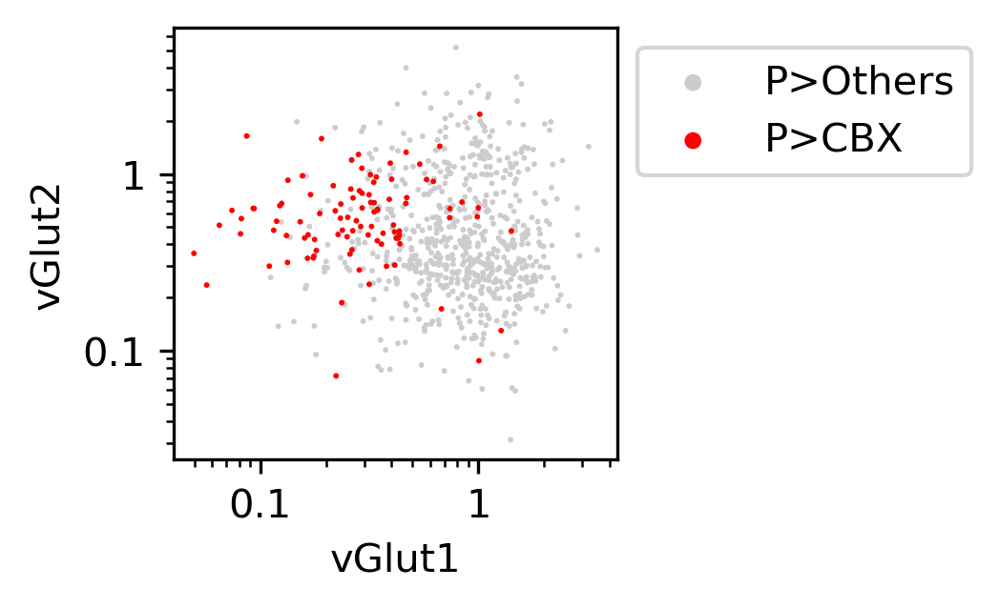

In [60]:
fig, ax = plt.subplots(figsize=(2,2), dpi=300)
selc = (data['Target']=='CBX')
# ax.plot([0.05, 5], [1, 1], 'k', linewidth=0.5)
# ax.plot([1, 1], [0.05, 5], 'k', linewidth=0.5)
# ax.scatter(data0['vGlut1'], data0['vGlut2'], c=(0.8, 0.8, 0.8), s=0.2, label='P>Others', edgecolor='none')
ax.scatter(data.loc[~selc, 'vGlut1'], data.loc[~selc, 'vGlut2'], c=(0.8, 0.8, 0.8), alpha=1, s=2, label='P>Others', edgecolor='none', rasterized=True)
ax.scatter(data.loc[selc, 'vGlut1'], data.loc[selc, 'vGlut2'], c=(1, 0, 0), s=2, label='P>CBX', edgecolor='none', rasterized=True)
# sns.scatterplot(data=data, x='vGlut1', y='vGlut2', hue='Target', s=6, alpha=1, ax=ax)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('vGlut1')
ax.set_ylabel('vGlut2')
ax.legend(markerscale=3, bbox_to_anchor=(1,1))
ax.set_xticks([0.1, 1])
ax.set_xticklabels([0.1, 1])
ax.set_yticks([0.1, 1])
ax.set_yticklabels([0.1, 1])

plt.savefig('', transparent=True)


In [132]:
reg = 'AMY'

In [133]:
selc = meta_rs2.index[meta_rs2['DissectionRegion'].isin(rs2_subregion_dict[reg])]
print(len(selc))

1425


In [134]:
mcds_rs2 = MCDS.open("/cemba/CEMBA_RS2/CEMBA.epiretro.mcds", var_dim='geneslop2k', use_obs=selc)
tmp = mcds_rs2.sel({'geneslop2k':pd.Index(['Slc17a7', 'Slc17a6']).map(mm10.gene_name_to_id), 'mc_type':'CHN'})
data = tmp['geneslop2k_da_frac'].to_pandas()

In [135]:
data.columns = data.columns.map(mm10.gene_id_to_name).map({'Slc17a7':'vGlut1', 'Slc17a6':'vGlut2'})
data['Target'] = meta_rs2.loc[data.index, 'Target']


In [136]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
data = data.loc[(data['vGlut1']!=1) & (data['vGlut2']!=1)]

In [137]:
tarall = ["PFC", "MOp", "SSp", "ACA", "AI", "AUDp", "RSP", "PTLp", "VISp", 
          "MOB", "ENT", "HPF", "PIR", "AMY", "STR", "PAL", 
          "TH", "HY", "SC", "VTA", "P", "MY", "CBN", "CBX"]
target_list = [xx for xx in tarall if xx in data["Target"].values]
target_list

['PFC', 'MOB', 'ENT', 'HPF', 'STR', 'TH', 'VTA', 'P', 'MY']

In [138]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['vGlut1']!=1) & (data['vGlut2']!=1)]

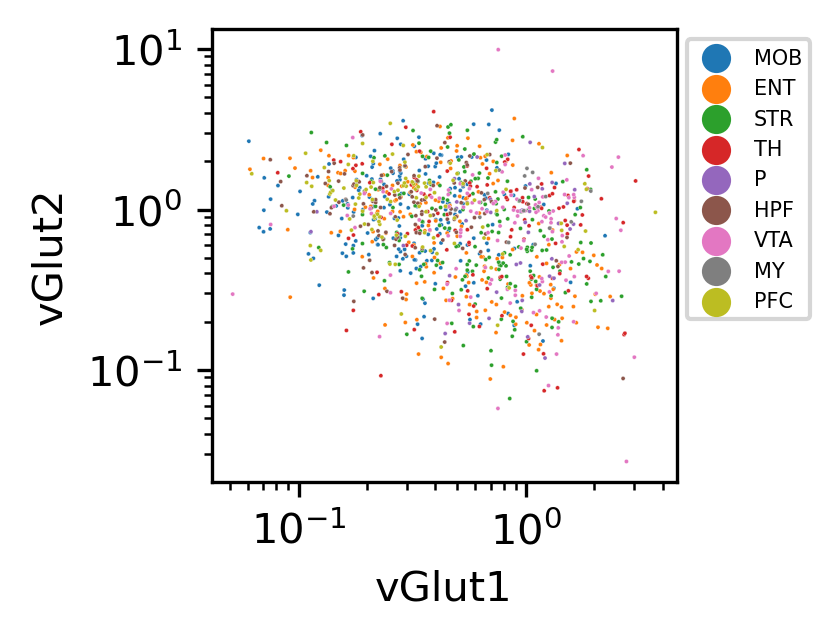

In [140]:
fig, ax = plt.subplots(figsize=(2,2), dpi=300)
sns.scatterplot(data=tmp, x='vGlut1', y='vGlut2', hue='Target', s=1, ax=ax, palette='tab10')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(bbox_to_anchor=(1,1), fontsize=5)

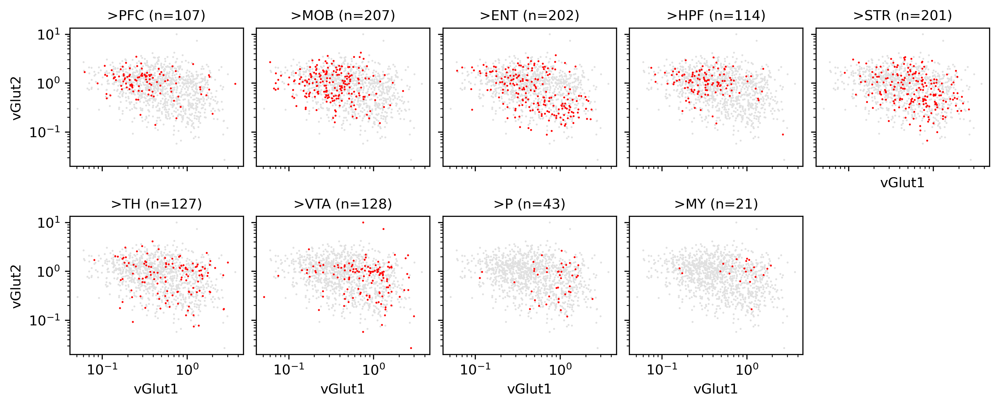

In [141]:
ncol = 5
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 2, nrow * 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (tmp['Target']==xx)
    ax.scatter(tmp.loc[~selc, 'vGlut1'], tmp.loc[~selc, 'vGlut2'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'vGlut1'], tmp.loc[selc, 'vGlut2'], c='r', s=2, edgecolor='none', rasterized=True)
    ax.set_title(f">{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
for ax in axes[:, 0]:
    ax.set_ylabel('vGlut2')

for ax in axes.flatten()[(len(target_list)-5):len(target_list)]:
    ax.set_xlabel('vGlut1')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")



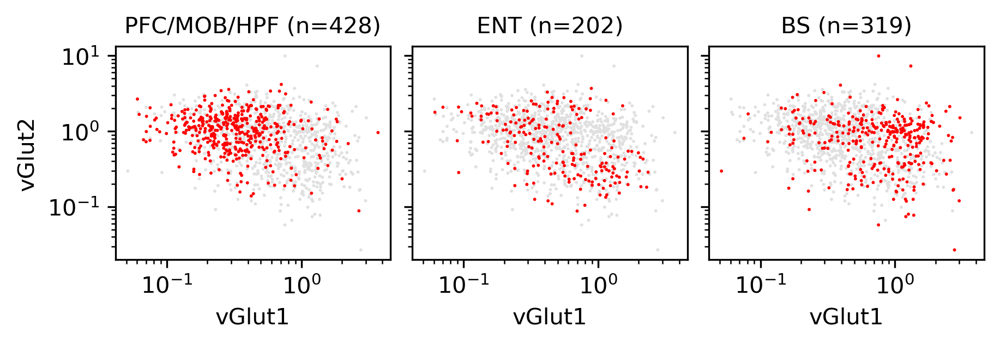

In [146]:
fig, axes = plt.subplots(1, 3, figsize=(6, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

ax = axes[0]
selc = (tmp['Target'].isin(['PFC', 'MOB', 'HPF']))
ax.scatter(tmp.loc[~selc, 'vGlut1'], tmp.loc[~selc, 'vGlut2'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
ax.scatter(tmp.loc[selc, 'vGlut1'], tmp.loc[selc, 'vGlut2'], c='r', s=2, edgecolor='none', rasterized=True)
ax.set_title(f"PFC/MOB/HPF (n={selc.sum()})", fontsize=10)

ax = axes[1]
selc = (tmp['Target'].isin(['ENT']))
ax.scatter(tmp.loc[~selc, 'vGlut1'], tmp.loc[~selc, 'vGlut2'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
ax.scatter(tmp.loc[selc, 'vGlut1'], tmp.loc[selc, 'vGlut2'], c='r', s=2, edgecolor='none', rasterized=True)
ax.set_title(f"ENT (n={selc.sum()})", fontsize=10)

ax = axes[2]
selc = (tmp['Target'].isin(['TH', 'VTA', 'P', 'MY']))
ax.scatter(tmp.loc[~selc, 'vGlut1'], tmp.loc[~selc, 'vGlut2'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
ax.scatter(tmp.loc[selc, 'vGlut1'], tmp.loc[selc, 'vGlut2'], c='r', s=2, edgecolor='none', rasterized=True)
ax.set_title(f"BS (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')

for ax in axes:
    ax.set_xlabel('vGlut1')

axes[0].set_ylabel('vGlut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")



In [4]:
reg = 'VTA'

In [5]:
meta_rs1 = cemba.get_mc_mapping_metric()
selc = meta_rs1.index[meta_rs1['DissectionRegion'].isin(rs1_subregion_dict[reg])]
print(selc.shape)

(5487,)


In [9]:
cemba.CEMBA_SNMC_MCDS_PATH

PosixPath('/cemba/CEMBA_RS1/dataset/CEMBA.snmC.mcds')

In [10]:
mcds_rs1 = MCDS.open(cemba.CEMBA_SNMC_MCDS_PATH, var_dim='geneslop2k-vm23', use_obs=selc)
tmp = mcds_rs1.sel({'geneslop2k-vm23':pd.Index(['Th', 'Slc17a6', 'Gad2']).map(mm10.gene_name_to_id), 'mc_type':'CHN'})
data = tmp['geneslop2k-vm23_da_frac'].to_pandas()

In [12]:
ntmap = {'Th':'Th', 'Slc17a6':'Vglut2', 'Gad2':'Gad2'}
data.columns = data.columns.map(mm10.gene_id_to_name).map(ntmap)
data = 1/data

In [16]:
data

geneslop2k-vm23,Th,Vglut2,Gad2
cell,,,
11J_M_1444,0.464332,0.671921,0.593367
10J_M_1164,0.653870,1.049425,0.869610
11J_M_403,0.691109,1.657546,2.213696
10J_M_1381,1.228249,1.086979,0.844734
10J_M_1,0.792785,2.534074,0.852825
...,...,...,...
11J_M_1003,0.589175,1.510509,1.438379
10J_M_414,0.654115,1.528686,1.280851
11J_M_27,0.564015,1.195908,1.255607


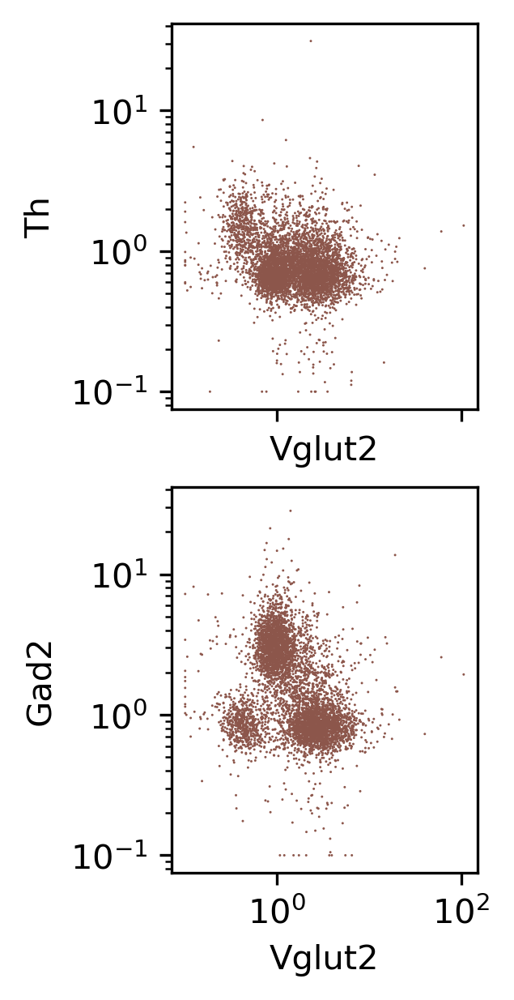

In [19]:
fig, axes = plt.subplots(2, 1, figsize=(2, 4), dpi=300, sharex='all', sharey='all', constrained_layout=True)

ax = axes[0]
tmp = data.loc[(data['Th']!=1) & (data['Vglut2']!=1)]
ax.scatter(tmp['Vglut2'], tmp['Th'], c='C5', s=0.5, edgecolor='none', rasterized=True)
ax.set_ylabel('Th')

ax = axes[1]
tmp = data.loc[(data['Gad2']!=1) & (data['Vglut2']!=1)]
ax.scatter(tmp['Vglut2'], tmp['Gad2'], c='C5', s=0.5, edgecolor='none', rasterized=True)
ax.set_ylabel('Gad2')

ax.set_yscale('log')
ax.set_xscale('log')

for ax in axes:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

# plt.savefig('plot/VTA_targetgroup_Dopa_vGlut2_inverse.pdf', transparent=True)


In [21]:
data['Target'] = 'RS1'
data_rs1 = data.copy()

In [45]:
selc = meta_rs2.index[meta_rs2['DissectionRegion'].isin(rs2_subregion_dict[reg])]
print(len(selc))

2045


In [46]:
mcds_rs2 = MCDS.open("/cemba/CEMBA_RS2/CEMBA.epiretro.mcds", var_dim='geneslop2k', use_obs=selc)
tmp = mcds_rs2.sel({'geneslop2k':pd.Index(['Th', 'Slc17a6', 'Gad2']).map(mm10.gene_name_to_id), 'mc_type':'CHN'})
data = tmp['geneslop2k_da_frac'].to_pandas()

In [47]:
data = 1/data

In [48]:
ntmap = {'Th':'Th', 'Slc17a6':'Vglut2', 'Gad2':'Gad2'}
data.columns = data.columns.map(mm10.gene_id_to_name).map(ntmap)
data['Target'] = meta_rs2.loc[data.index, 'Target']


In [26]:
tarall = ["PFC", "MOp", "SSp", "ACA", "AI", "AUDp", "RSP", "PTLp", "VISp", 
          "MOB", "ENT", "HPF", "PIR", "AMY", "STR", "PAL", 
          "TH", "HY", "SC", "VTA", "P", "MY", "CBN", "CBX"]
target_list = [xx for xx in tarall if xx in data["Target"].values]
target_list

['PFC',
 'MOp',
 'SSp',
 'ACA',
 'RSP',
 'PTLp',
 'MOB',
 'ENT',
 'PIR',
 'AMY',
 'STR',
 'PAL',
 'TH',
 'HY',
 'SC',
 'P']

In [49]:
data = pd.concat([data, data_rs1], axis=0)
data

,Th,Vglut2,Gad2,Target
cell,,,,
Pool154_Plate3-1-E1-B1,1.000000,1.350469,0.700305,MOB
Pool154_Plate3-1-E1-B13,0.655960,3.838720,0.782237,MOB
Pool154_Plate3-1-E1-B14,0.811503,2.218726,0.664649,MOB
Pool154_Plate3-1-E1-F1,0.612447,1.000000,1.868113,MOB
Pool154_Plate3-1-E1-F13,0.568204,4.538196,0.966450,MOB
...,...,...,...,...
11J_M_1003,0.589175,1.510509,1.438379,Unbiased
10J_M_414,0.654115,1.528686,1.280851,Unbiased
11J_M_27,0.564015,1.195908,1.255607,Unbiased


In [34]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['DA']!=1) & (data['Glu']!=1)]

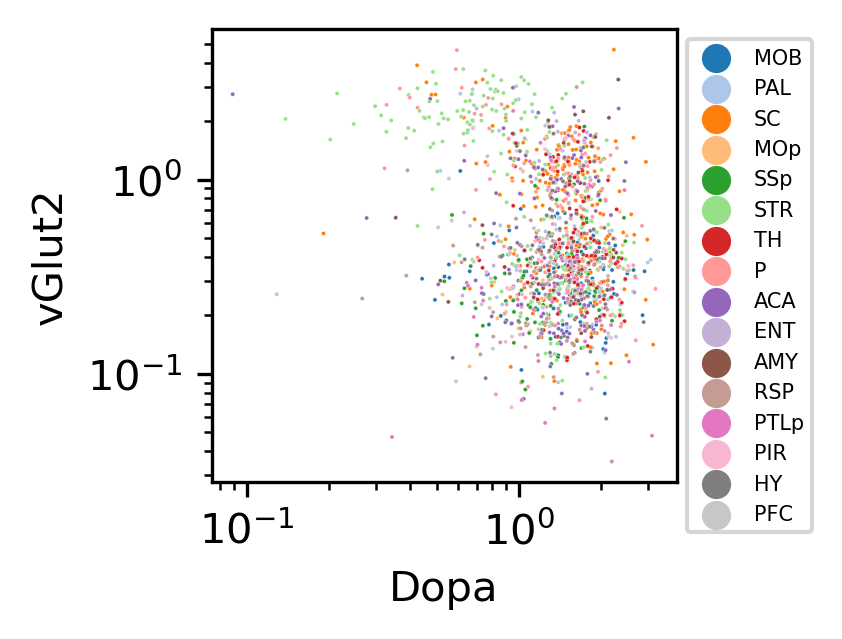

In [153]:
fig, ax = plt.subplots(figsize=(2,2), dpi=300)
sns.scatterplot(data=tmp, x='DA', y='Glu', hue='Target', s=1, ax=ax, palette='tab20')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(bbox_to_anchor=(1,1), fontsize=5)

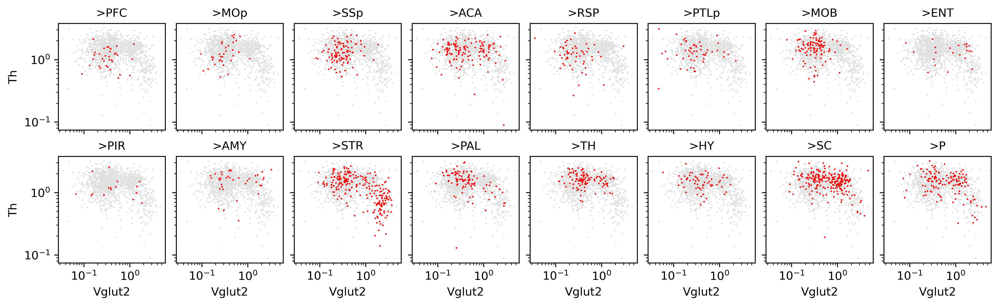

In [35]:
ncol = 8
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 1.5, nrow * 1.8), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (tmp['Target']==xx)
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'DA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'DA'], c='r', s=2, edgecolor='none', rasterized=True)
    ax.set_title(f">{xx}", fontsize=10)
    # ax.set_title(f">{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
for ax in axes[:, 0]:
    ax.set_ylabel('Th')

for ax in axes.flatten()[(len(target_list)-ncol):len(target_list)]:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_target_Dopa_vGlut2.pdf', transparent=True)


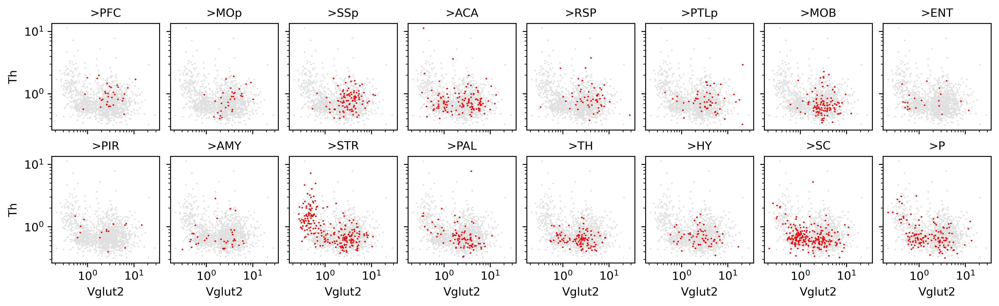

In [21]:
ncol = 8
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 1.5, nrow * 1.8), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (tmp['Target']==xx)
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'DA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'DA'], c='r', s=2, edgecolor='none', rasterized=True)
    ax.set_title(f">{xx}", fontsize=10)
    # ax.set_title(f">{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
for ax in axes[:, 0]:
    ax.set_ylabel('Th')

for ax in axes.flatten()[(len(target_list)-ncol):len(target_list)]:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_target_Dopa_vGlut2_inverse.pdf', transparent=True)


In [36]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['GABA']!=1) & (data['Glu']!=1)]

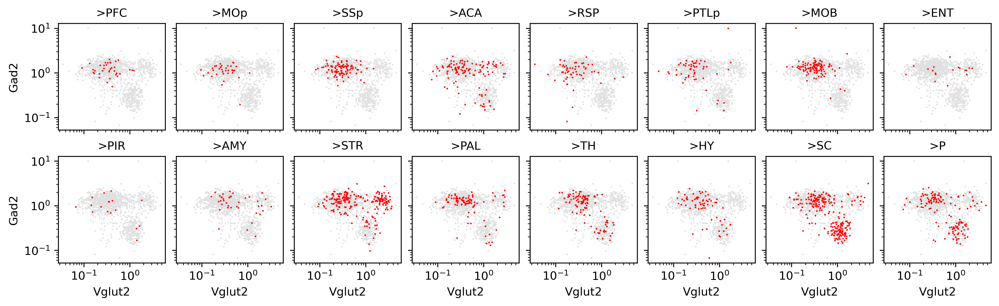

In [37]:
ncol = 8
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 1.5, nrow * 1.8), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (tmp['Target']==xx)
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'GABA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'GABA'], c='r', s=2, edgecolor='none', rasterized=True)
    ax.set_title(f">{xx}", fontsize=10)
    # ax.set_title(f">{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
for ax in axes[:, 0]:
    ax.set_ylabel('Gad2')

for ax in axes.flatten()[(len(target_list)-ncol):len(target_list)]:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_target_Gad_vGlut2.pdf', transparent=True)


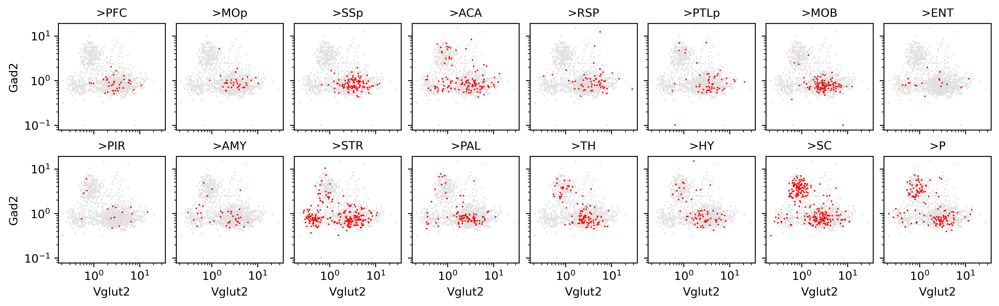

In [24]:
ncol = 8
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 1.5, nrow * 1.8), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (tmp['Target']==xx)
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'GABA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'GABA'], c='r', s=2, edgecolor='none', rasterized=True)
    ax.set_title(f">{xx}", fontsize=10)
    # ax.set_title(f">{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
for ax in axes[:, 0]:
    ax.set_ylabel('Gad2')

for ax in axes.flatten()[(len(target_list)-ncol):len(target_list)]:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_target_Gad_vGlut2_inverse.pdf', transparent=True)


In [10]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['GABA']!=1) & (data['DA']!=1)]

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


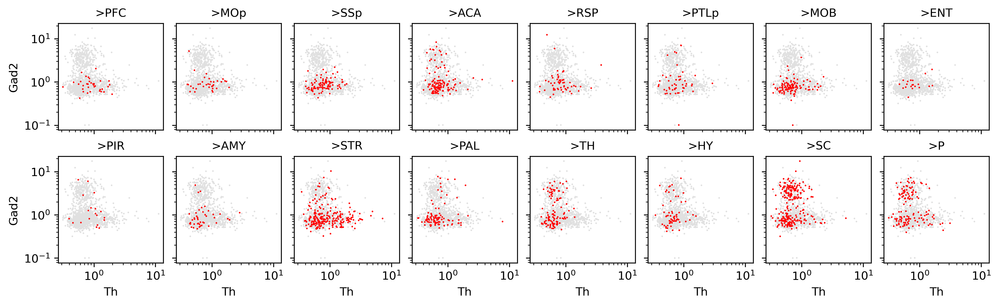

In [11]:
ncol = 8
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 1.5, nrow * 1.8), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (tmp['Target']==xx)
    ax.scatter(tmp.loc[~selc, 'DA'], tmp.loc[~selc, 'GABA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'DA'], tmp.loc[selc, 'GABA'], c='r', s=2, edgecolor='none', rasterized=True)
    ax.set_title(f">{xx}", fontsize=10)
    # ax.set_title(f">{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
for ax in axes[:, 0]:
    ax.set_ylabel('Gad2')

for ax in axes.flatten()[(len(target_list)-ncol):len(target_list)]:
    ax.set_xlabel('Th')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_target_Gad_Dopa_inverse.pdf', transparent=True)


In [50]:
tardict = {'CTX':['PFC', 'MOp', 'SSp', 'RSP', 'PTLp'],
           'MOB':['MOB'],
           'STR':['STR'],
           'PAL':['PAL'],
           'ET':['TH', 'HY', 'SC', 'P'],
           'Unbiased':['Unbiased'], 
           'Others':['ACA', 'ENT', 'PIR', 'AMY']
          }
tarmap = {xx:yy for yy in tardict for xx in tardict[yy]}

In [51]:
data['TargetGroup'] = data['Target'].map(tarmap)


In [52]:
# palette = {'CTX':'#176CDB', 'MOB':'#FADF63', 'STR':'#7B42CD', 'PAL':'#a83795', 'ET':'#74e44b'}
palette = {'CTX':'C0', 'MOB':'C1', 'STR':'C2', 'PAL':'C3', 'ET':'C4', 'Unbiased':'C5'}

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


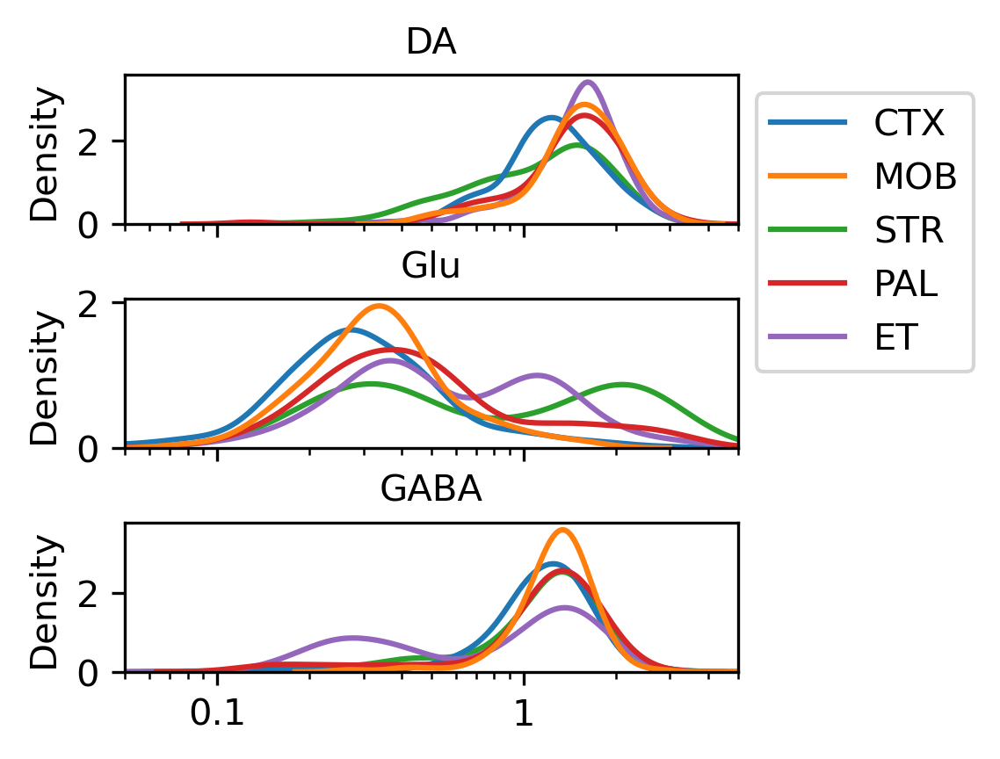

In [84]:
fig, axes = plt.subplots(3, 1, figsize=(3, 3), sharex='all', dpi=300, gridspec_kw={'hspace': 0.5})
for i,xx in enumerate(['DA', 'Glu', 'GABA']):
    ax = axes[i]
    sns.kdeplot(data.loc[(data['TargetGroup']!='Others') & (data[xx]!=1)], x=xx, hue='TargetGroup', palette=palette, bw_adjust=1, log_scale=10, common_norm=False, ax=ax)
    ax.legend().set_visible(False)
    ax.set_xlim([0.05, 5])
    ax.set_title(xx, fontsize=10)
    ax.set_xlabel('')
    ax.set_xticks([0.1, 1])
    ax.set_xticklabels([0.1, 1])

markers = [
    plt.Line2D([0, 0], [0, 0], color=color, linestyle="-")
    for color in palette.values()
]
axes[0].legend(
    markers, palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
)

plt.tight_layout()
plt.savefig('plot/VTA_targetgroup_neurotransmitter_density.pdf', transparent=True)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


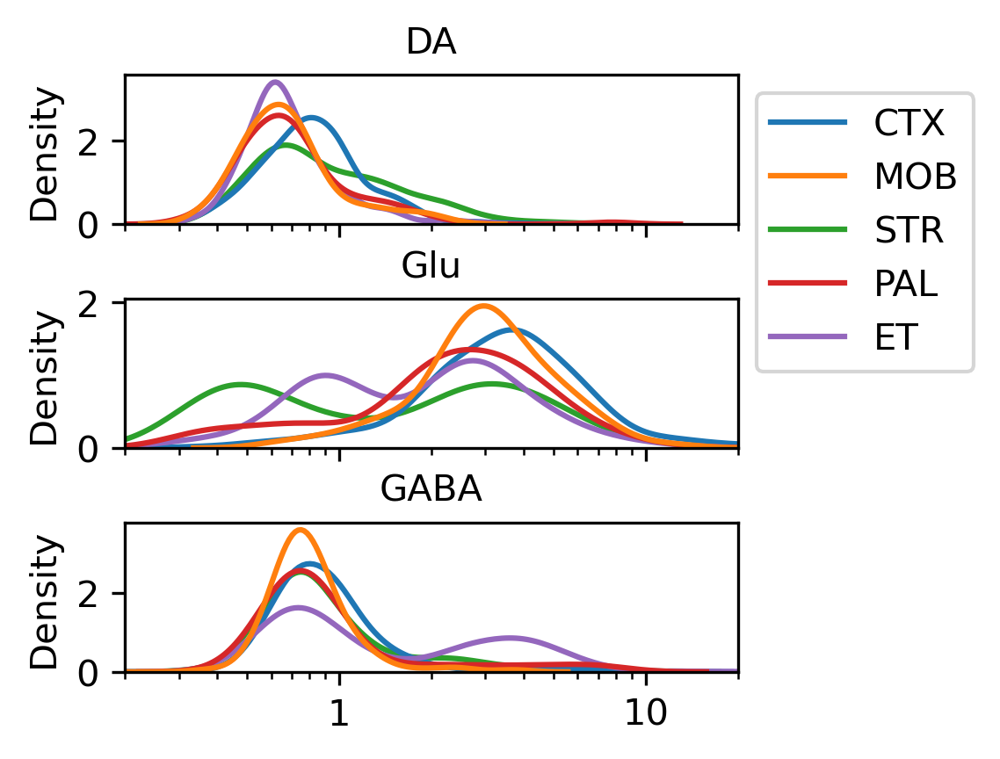

In [77]:
fig, axes = plt.subplots(3, 1, figsize=(3, 3), sharex='all', dpi=300, gridspec_kw={'hspace': 0.5})
for i,xx in enumerate(['DA', 'Glu', 'GABA']):
    ax = axes[i]
    sns.kdeplot(data.loc[(data['TargetGroup']!='Others') & (data[xx]!=1)], x=xx, hue='TargetGroup', palette=palette, bw_adjust=1, log_scale=10, common_norm=False, ax=ax)
    ax.legend().set_visible(False)
    ax.set_xlim([0.2, 20])
    ax.set_title(xx, fontsize=10)
    ax.set_xlabel('')
    ax.set_xticks([1, 10])
    ax.set_xticklabels([1, 10])

markers = [
    plt.Line2D([0, 0], [0, 0], color=color, linestyle="-")
    for color in palette.values()
]
axes[0].legend(
    markers, palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
)

plt.tight_layout()
plt.savefig('plot/VTA_targetgroup_neurotransmitter_density_inverse.pdf', transparent=True)

In [58]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['Th']!=1) & (data['Vglut2']!=1)]


In [54]:
from scipy.stats import ranksums
tmp = data.loc[data['Th']!=1]
tmp = [tmp.loc[tmp['TargetGroup']==xx, 'Th'] for xx in palette.keys()]


In [55]:
group_list = ['CTX', 'MOB', 'STR', 'PAL', 'ET', 'Unbiased']

In [23]:
for i in range(len(palette)-1):
    for j in range(i+1, len(palette)):
        print(group_list[i], group_list[j], ranksums(tmp[i], tmp[j]))


CTX MOB RanksumsResult(statistic=5.13947809568533, pvalue=2.7550260413179094e-07)
CTX STR RanksumsResult(statistic=-1.891320083524113, pvalue=0.05858162934242856)
CTX PAL RanksumsResult(statistic=4.17719777179199, pvalue=2.9512240841879448e-05)
CTX ET RanksumsResult(statistic=7.799910744568329, pvalue=6.195097681590856e-15)
MOB STR RanksumsResult(statistic=-5.451274178319215, pvalue=5.0010197345415704e-08)
MOB PAL RanksumsResult(statistic=-0.5324970797655344, pvalue=0.5943817638330082)
MOB ET RanksumsResult(statistic=-0.33458632052079623, pvalue=0.7379371653796054)
STR PAL RanksumsResult(statistic=4.6231678099275895, pvalue=3.779237446721291e-06)
STR ET RanksumsResult(statistic=8.11739973890192, pvalue=4.76277985999551e-16)
PAL ET RanksumsResult(statistic=0.45632896092069203, pvalue=0.6481534412284845)


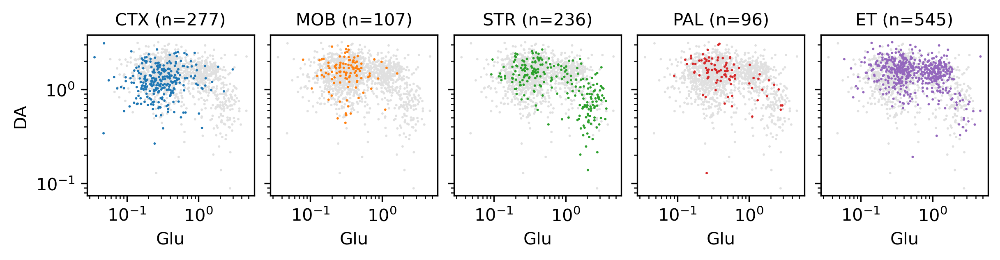

In [60]:
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'DA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'DA'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')

axes[0].set_ylabel('DA')

for ax in axes:
    ax.set_xlabel('Glu')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_Dopa_vGlut2.pdf', transparent=True)


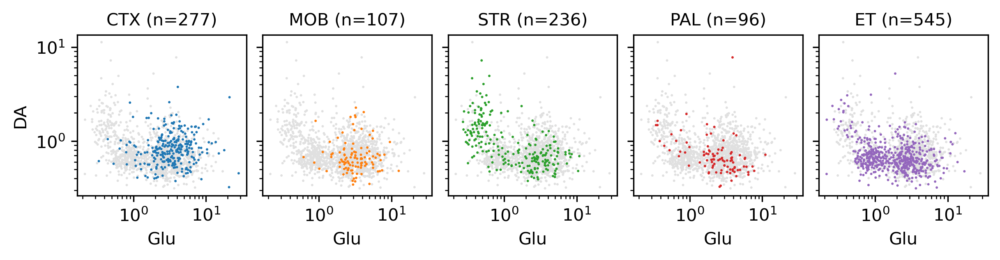

In [29]:
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'DA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'DA'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')

axes[0].set_ylabel('DA')

for ax in axes:
    ax.set_xlabel('Glu')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_Dopa_vGlut2_inverse.pdf', transparent=True)


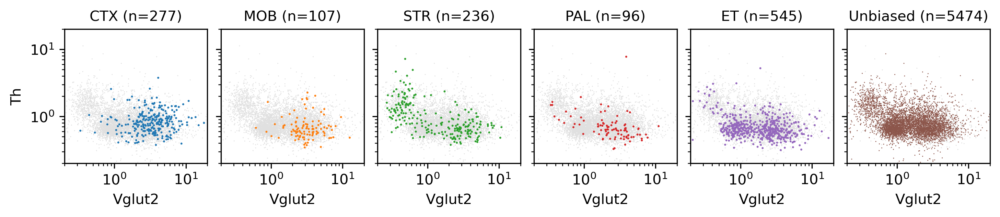

In [59]:
fig, axes = plt.subplots(1, 6, figsize=(9.6, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET', 'Unbiased']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Vglut2'], tmp.loc[~selc, 'Th'], c='#e0e0e0', alpha=1, s=0.5, edgecolor='none', rasterized=True)
    if xx=='Unbiased':
        ax.scatter(tmp.loc[selc, 'Vglut2'], tmp.loc[selc, 'Th'], c=palette[xx], s=0.5, edgecolor='none', rasterized=True)
    else:
        ax.scatter(tmp.loc[selc, 'Vglut2'], tmp.loc[selc, 'Th'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylim([0.2, 20])
ax.set_xlim([0.2, 20])
axes[0].set_ylabel('Th')

for ax in axes:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

# plt.savefig('plot/VTA_targetgroup_Dopa_vGlut2_inverse.pdf', transparent=True)


In [60]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['Gad2']!=1) & (data['Vglut2']!=1)]


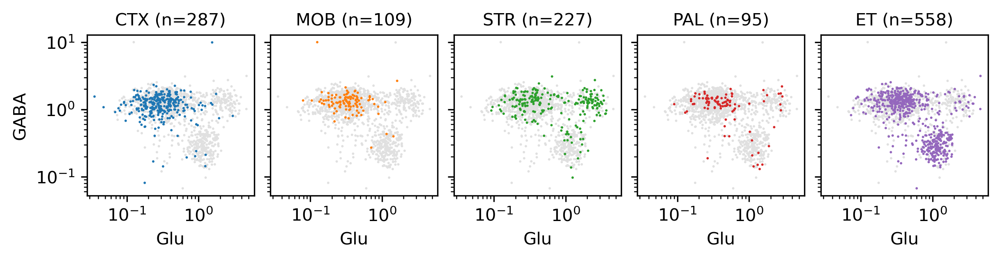

In [62]:
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'GABA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'GABA'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')

axes[0].set_ylabel('GABA')

for ax in axes:
    ax.set_xlabel('Glu')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_Gad_vGlut2.pdf', transparent=True)


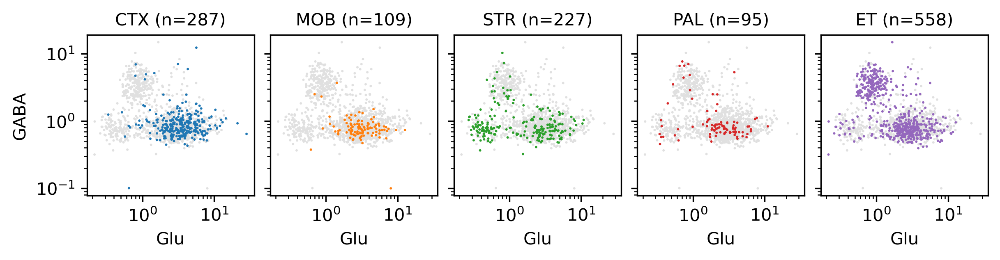

In [31]:
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Glu'], tmp.loc[~selc, 'GABA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'Glu'], tmp.loc[selc, 'GABA'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')

axes[0].set_ylabel('GABA')

for ax in axes:
    ax.set_xlabel('Glu')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_Gad_vGlut2_inverse.pdf', transparent=True)


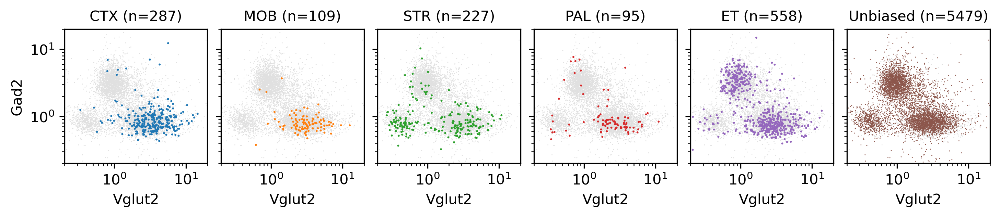

In [63]:
fig, axes = plt.subplots(1, 6, figsize=(9.6, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET', 'Unbiased']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Vglut2'], tmp.loc[~selc, 'Gad2'], c='#e0e0e0', alpha=1, s=0.5, edgecolor='none', rasterized=True)
    if xx=='Unbiased':
        ax.scatter(tmp.loc[selc, 'Vglut2'], tmp.loc[selc, 'Gad2'], c=palette[xx], s=0.5, edgecolor='none', rasterized=True)
    else:
        ax.scatter(tmp.loc[selc, 'Vglut2'], tmp.loc[selc, 'Gad2'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)

ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylim([0.2, 20])
ax.set_xlim([0.2, 20])

axes[0].set_ylabel('Gad2')

for ax in axes:
    ax.set_xlabel('Vglut2')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

# plt.savefig('plot/VTA_targetgroup_Gad_vGlut2_inverse.pdf', transparent=True)


In [64]:
# data[['Slc17a7', 'Slc17a6']] = np.log2(data[['Slc17a7', 'Slc17a6']])
tmp = data.loc[(data['Gad2']!=1) & (data['Th']!=1)]


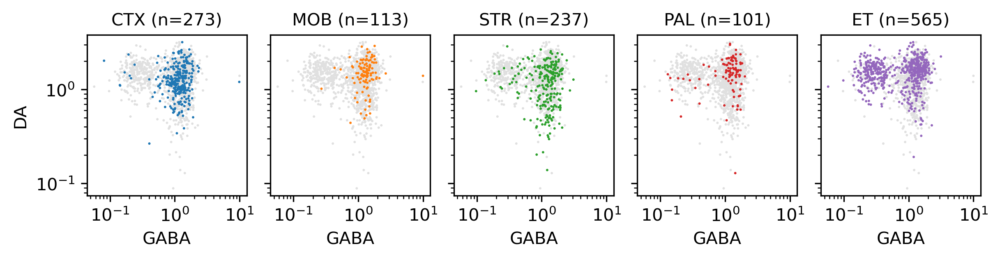

In [64]:
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'GABA'], tmp.loc[~selc, 'DA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'GABA'], tmp.loc[selc, 'DA'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)


ax.set_yscale('log')
ax.set_xscale('log')

for ax in axes:
    ax.set_xlabel('GABA')

axes[0].set_ylabel('DA')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_Dopa_Gad.pdf', transparent=True)


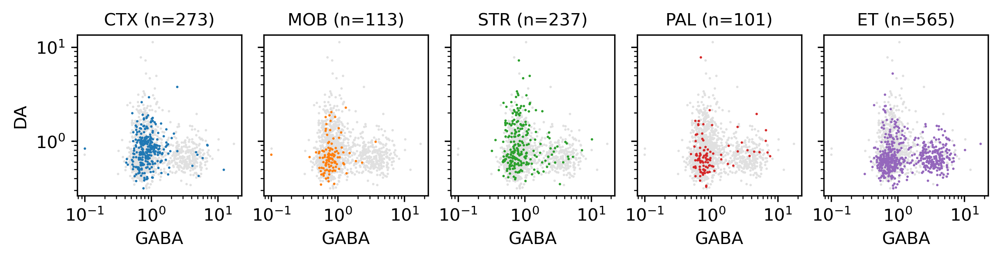

In [33]:
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'GABA'], tmp.loc[~selc, 'DA'], c='#e0e0e0', alpha=1, s=2, edgecolor='none', rasterized=True)
    ax.scatter(tmp.loc[selc, 'GABA'], tmp.loc[selc, 'DA'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)


ax.set_yscale('log')
ax.set_xscale('log')

for ax in axes:
    ax.set_xlabel('GABA')

axes[0].set_ylabel('DA')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_Dopa_Gad_inverse.pdf', transparent=True)


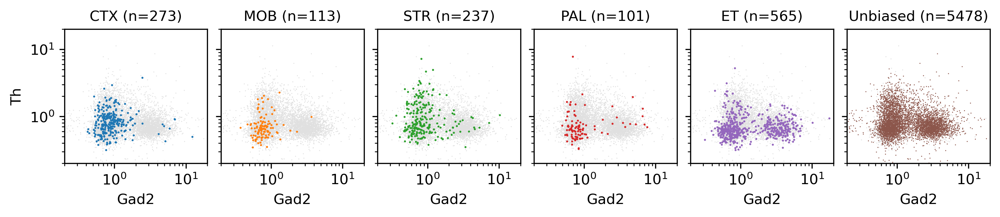

In [65]:
fig, axes = plt.subplots(1, 6, figsize=(9.6, 2), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i,xx in enumerate(['CTX', 'MOB', 'STR', 'PAL', 'ET', 'Unbiased']):
    ax = axes[i]
    selc = (tmp['Target'].isin(tardict[xx]))
    ax.scatter(tmp.loc[~selc, 'Gad2'], tmp.loc[~selc, 'Th'], c='#e0e0e0', alpha=1, s=0.5, edgecolor='none', rasterized=True)
    if xx=='Unbiased':
        ax.scatter(tmp.loc[selc, 'Gad2'], tmp.loc[selc, 'Th'], c=palette[xx], s=0.5, edgecolor='none', rasterized=True)
    else:
        ax.scatter(tmp.loc[selc, 'Gad2'], tmp.loc[selc, 'Th'], c=palette[xx], s=2, edgecolor='none', rasterized=True)
    ax.set_title(f"{xx} (n={selc.sum()})", fontsize=10)


ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylim([0.2, 20])
ax.set_xlim([0.2, 20])

for ax in axes:
    ax.set_xlabel('Gad2')

axes[0].set_ylabel('Th')

# markers = [
#     plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
#     for color in target_palette.values()
# ]

# if len(target_list)<=ncol:
#     ax = axes[len(target_list)-1]
# else:
#     ax = axes[0, -1]
# ax.legend(
#     markers, target_palette.keys(), numpoints=1, bbox_to_anchor=(1, 1), loc="upper left"
# )

for ax in axes.flatten()[len(target_list):]:
    ax.axis("off")

# plt.savefig('plot/VTA_targetgroup_Dopa_Gad_inverse.pdf', transparent=True)


In [66]:
from wmb import aibs, cemba, mm10

In [67]:
adata = anndata.read_h5ad(glob('/home/jzhou_salk_edu/sky_workdir/230314_VTAplots/VTA_*_rs1rs2rna.h5ad')[0])
adata

AnnData object with n_obs × n_vars = 11801 × 1
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'L1', 'L1_annot', 'L4', 'L4Region', 'L2_annot', 'Train', 'Study', 'PlateNormReads', 'Exp', 'Source', 'Target', 'Sex', 'L2', 'L3', 'PassTargetFilter', 'count', 'umi_count', 'tsne_0', 'tsne_1', 'leiden'
    uns: 'leiden', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'u20seurat_tsne'
    obsp: 'connectivities', 'distances'

In [68]:
adata.obs['Target'] = adata.obs['Target'].astype(str)
adata.obs['Target'] = '?'
adata.obs.loc[adata.obs.index.isin(meta_rs2.index), 'Target'] = meta_rs2['Target']

In [69]:
adata.obs['TargetGroup'] = '?'
adata.obs.loc[adata.obs.index.isin(meta_rs2.index), 'TargetGroup'] = adata.obs.loc[adata.obs.index.isin(meta_rs2.index), 'Target'].map(tarmap)


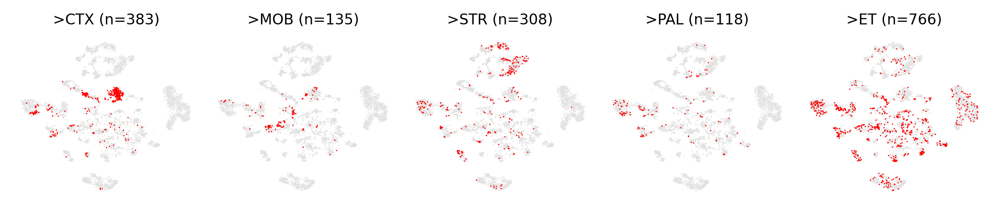

In [74]:
ncol = 5
fig, axes = plt.subplots(1, ncol, figsize=(ncol * 1.5, 1.5), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(['CTX', 'MOB', 'STR', 'PAL', 'ET'], axes.flatten()):
    selc = (adata.obs['TargetGroup']==xx)
    ax.scatter(adata.obs.loc[~selc, 'tsne_0'], adata.obs.loc[~selc, 'tsne_1'], c='#e0e0e0', alpha=1, s=0.2, edgecolor='none', rasterized=True)
    ax.scatter(adata.obs.loc[selc, 'tsne_0'], adata.obs.loc[selc, 'tsne_1'], c='r', s=0.5, edgecolor='none', rasterized=True)
    # ax.set_title(f">{xx}", fontsize=10)
    ax.set_title(f">{xx} (n={selc.sum()})", fontsize=8)

for ax in axes.flatten():
    ax.axis("off")

plt.savefig('plot/VTA_targetgroup_tsne.pdf', transparent=True)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


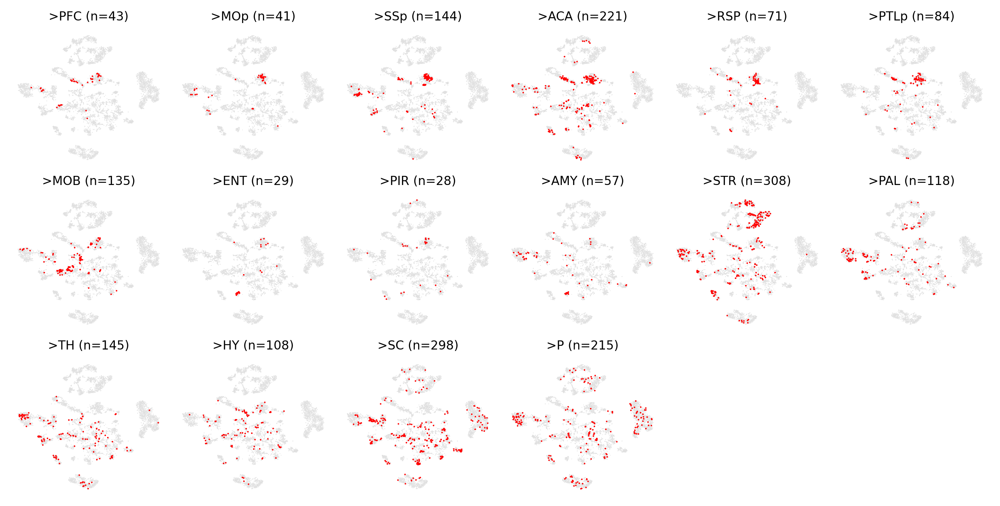

In [30]:
ncol = 6
nrow = (len(target_list) - 1) // ncol + 1
fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 1.5, nrow * 1.5), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for xx, ax in zip(target_list, axes.flatten()):
    selc = (adata.obs['Target']==xx)
    ax.scatter(adata.obs.loc[~selc, 'tsne_0'], adata.obs.loc[~selc, 'tsne_1'], c='#e0e0e0', alpha=1, s=0.2, edgecolor='none', rasterized=True)
    ax.scatter(adata.obs.loc[selc, 'tsne_0'], adata.obs.loc[selc, 'tsne_1'], c='r', s=1, edgecolor='none', rasterized=True)
    # ax.set_title(f">{xx}", fontsize=10)
    ax.set_title(f">{xx} (n={selc.sum()})", fontsize=8)

for ax in axes.flatten():
    ax.axis("off")

plt.savefig('plot/VTA_target_tsne.pdf', transparent=True)


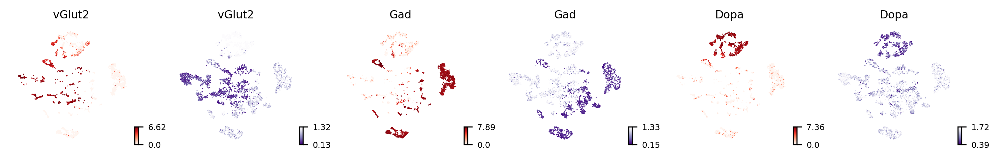

In [54]:
fig, axes = plt.subplots(1, 6, figsize=(10, 1.5), dpi=300, sharex='all', sharey='all', constrained_layout=True)

for i, xx in enumerate(['Slc17a6', 'Gad2', 'Th']):
    ax = axes.flatten()[i*2]
    selc = (adata.obs['Study']=='AIBS_10x')
    tmp = aibs.get_tenx_gene_data(xx).loc[adata.obs.index[selc]]
    vmin, vmax = np.around(np.percentile(tmp, [20, 99]), decimals=2)
    # ax.scatter(adata.obs.loc[~selc, 'tsne_0'], adata.obs.loc[~selc, 'tsne_1'], c='#e0e0e0', alpha=1, s=0.2, edgecolor='none', rasterized=True)
    plot = ax.scatter(adata.obs.loc[selc, 'tsne_0'], adata.obs.loc[selc, 'tsne_1'], 
                      c=tmp, vmin=vmin, vmax=vmax, s=0.5, cmap='Reds', 
                      edgecolor='none', rasterized=True)
    cbar = plt.colorbar(plot, ax=ax, shrink=0.15, aspect=5, pad=0.02, anchor=(0, 0))
    # vmin, vmax = np.around([cbar.vmin, cbar.vmax], decimals=2)
    cbar.set_ticks([vmin, vmax])
    cbar.set_ticklabels([vmin, vmax], fontsize=6)
    ax.set_title(ntmap[xx], fontsize=8)

for i, xx in enumerate(['Slc17a6', 'Gad2', 'Th']):
    ax = axes.flatten()[i*2+1]
    selc = (adata.obs['Study']=='CEMBA_snmC')
    tmp = cemba.get_mc_gene_frac(xx).loc[adata.obs.index[selc]]
    vmin, vmax = np.around(np.percentile(tmp, [1, 80]), decimals=2)
    # ax.scatter(adata.obs.loc[~selc, 'tsne_0'], adata.obs.loc[~selc, 'tsne_1'], c='#e0e0e0', alpha=1, s=0.2, edgecolor='none', rasterized=True)
    plot = ax.scatter(adata.obs.loc[selc, 'tsne_0'], adata.obs.loc[selc, 'tsne_1'], 
                      c=tmp, vmin=vmin, vmax=vmax, s=0.5, cmap='Purples_r', 
                      edgecolor='none', rasterized=True)
    cbar = plt.colorbar(plot, ax=ax, shrink=0.15, aspect=5, pad=0.02, anchor=(0, 0))
    cbar.set_ticks([vmin, vmax])
    cbar.set_ticklabels([vmin, vmax], fontsize=6)    
    ax.set_title(ntmap[xx], fontsize=8)

for ax in axes.flatten():
    ax.axis("off")

plt.savefig('plot/VTA_nt_tsne.pdf', transparent=True)
